In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import datetime
import time 

from scipy.stats import norm
# Test average window cnn
from scipy.ndimage import uniform_filter
from scipy.ndimage import gaussian_filter



In [2]:
import os 
import sys
sys.path.insert(0, '/Users/ajolaise/Library/CloudStorage/OneDrive-NTNU/PhD/code/CASCADE/src')
from Sinmod import Sinmod
from plotting.SinmodPlotting import SinmodPlotting

In [3]:
sinmod_path = "/Users/ajolaise/Library/CloudStorage/OneDrive-NTNU/PhD/code/CASCADE/data/sinmod/transfer_382450_files_da8d2b9a"
files = ["BioStates_froshelf.nc", "BioStates_midnor.nc", "mixOut.nc"]
plot_test_path = "/Users/ajolaise/Library/CloudStorage/OneDrive-NTNU/PhD/code/CASCADE/figures/tests/Sinmod/"

file_ind = 2
logging_kwargs = {
    "print_to_console": True,
    "log_file": plot_test_path + "Sinmod_notebook_log.txt",
    "overwrite_file": True
}
boundary_kwargs = {
    "border_file": "/border_files/cascade_test_xy.csv",
    "file_type": "xy"}

sinmod_c = Sinmod(sinmod_path + "/" + files[file_ind ], 
                        plot_path=plot_test_path,
                        log_kwargs=logging_kwargs,
                        boundary_kwargs=boundary_kwargs,
                      print_while_running=True)


2025-04-22 11:51:43    [INFO] [Sinmod] Setting up Sinmod class
2025-04-22 11:51:43    [INFO] [Sinmod] Setting up boundary
2025-04-22 11:51:43    [INFO] [Sinmod] Boundary kwargs: {'border_file': '/border_files/cascade_test_xy.csv', 'file_type': 'xy'}
2025-04-22 11:51:46    [INFO] [Sinmod] Reading file /Users/ajolaise/Library/CloudStorage/OneDrive-NTNU/PhD/code/CASCADE/data/sinmod/transfer_382450_files_da8d2b9a/mixOut.nc
<class 'netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.5
    title: Current data from SINMOD
    institution: SINTEF Ocean
    grid_mapping: grid_mapping
    grid_mapping_name: polar_stereographic
    straight_vertical_longitude_from_pole: 58.0
    horizontal_resolution: 800.0
    coordinate_north_pole: [3181.  2398.5]
    latitude_of_projection_origin: 90.0
    standard_parallel: 60.0
    barotropic_timestep: 3.2142857142857144
    baroclinic_timestep: 90.0
    _FillValue: -32768
    setup: midnor
    relax_e: T
    nested: T


In [4]:
sinmod_c.sinmod_file

<class 'netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.5
    title: Current data from SINMOD
    institution: SINTEF Ocean
    grid_mapping: grid_mapping
    grid_mapping_name: polar_stereographic
    straight_vertical_longitude_from_pole: 58.0
    horizontal_resolution: 800.0
    coordinate_north_pole: [3181.  2398.5]
    latitude_of_projection_origin: 90.0
    standard_parallel: 60.0
    barotropic_timestep: 3.2142857142857144
    baroclinic_timestep: 90.0
    _FillValue: -32768
    setup: midnor
    relax_e: T
    nested: T
    tidal_input: F
    DHA: 10.0
    smagorin: T
    biharmonic: F
    KBi: 0.0
    COLDSTART: F
    ATMODATA: 5
    CM: 0.5
    CM2D: 0.5
    CH: 0.3
    CI: 5.0
    icedyn: T
    tidal_components: [0 0 0 0 0 0 0 0 0 0 0]
    dimensions(sizes): xc(950), yc(555), zc(56), time(108), dummySampleDim(6)
    variables(dimensions): int32 time(time, dummySampleDim), int32 grid_mapping(), float32 LayerDepths(zc), float32 xc(xc)

In [15]:
DXxDYy = sinmod_c.sinmod_file.variables["DXxDYy"][:]
u = sinmod_c.sinmod_file.variables["u_east"][0, :, :, :]
v = sinmod_c.sinmod_file.variables["v_north"][0, :, :, :]
u_flatten = u[0, :, :].flatten()
v_flatten = v[0, :, :].flatten()


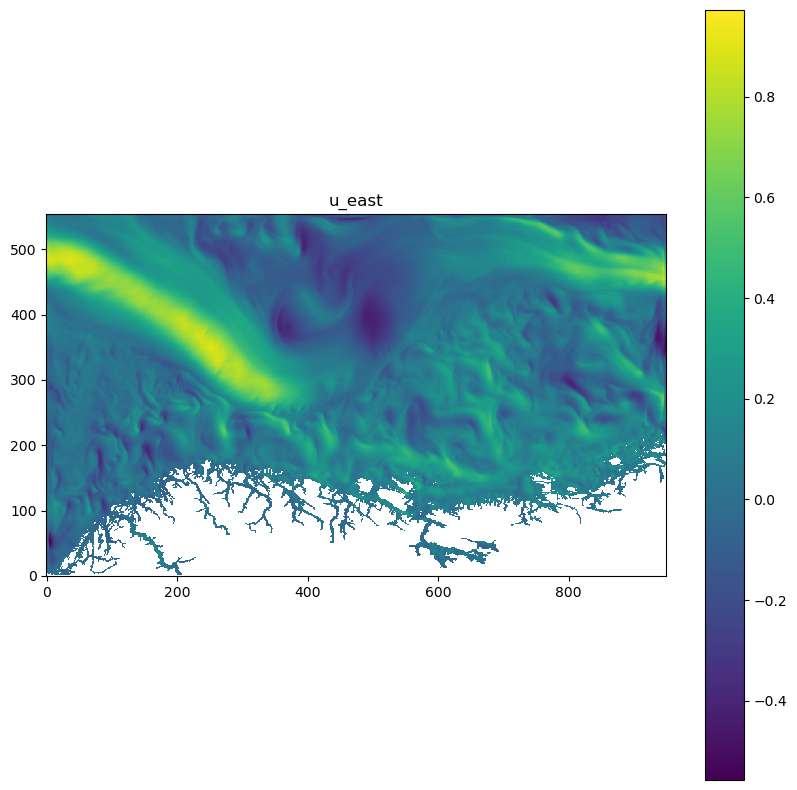

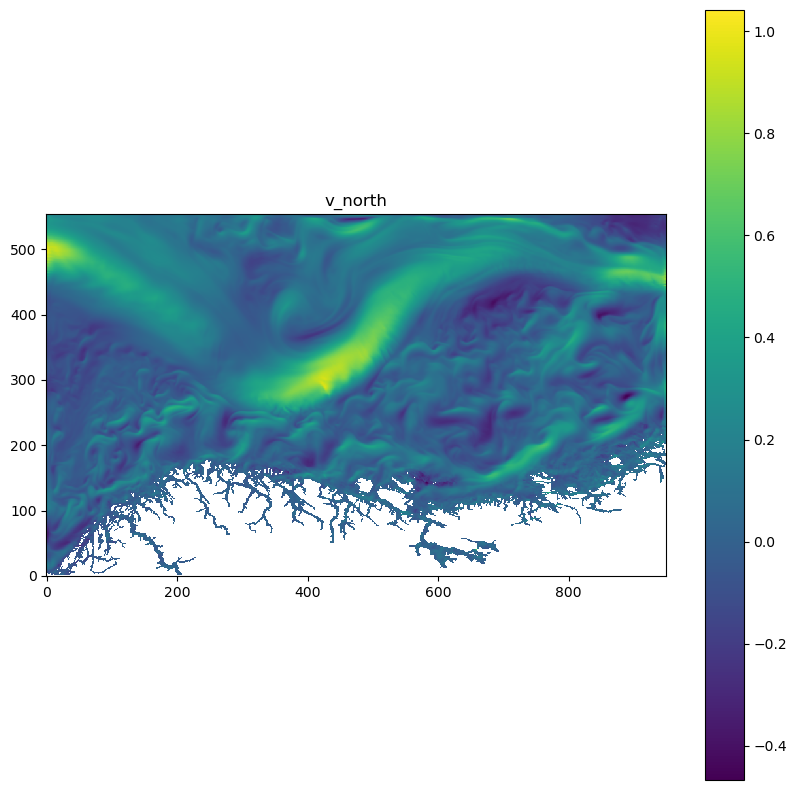

/var/folders/bh/g829gb2s2pzcl2m_k4fqzgg00000gn/T/ipykernel_37481/471911237.py:14: RuntimeWarning: invalid value encountered in sqrt
  plt.imshow(np.sqrt(u[0, :, :]**2 + v[0, :, :]**2), origin='lower', interpolation='nearest')


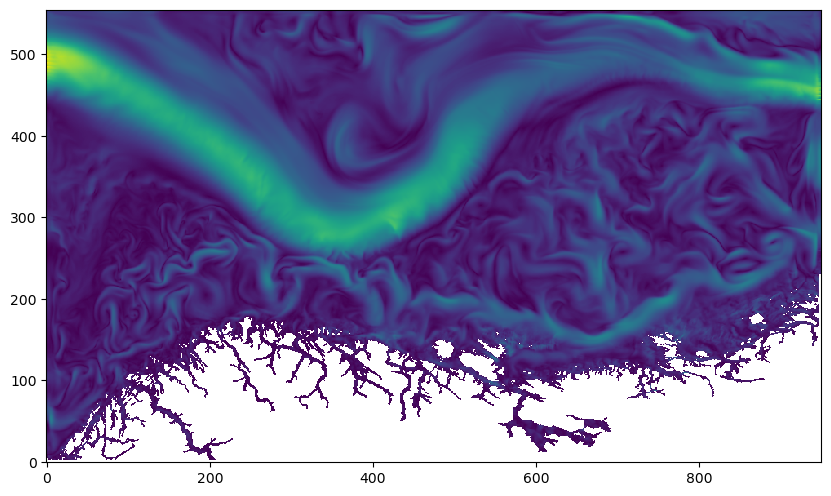

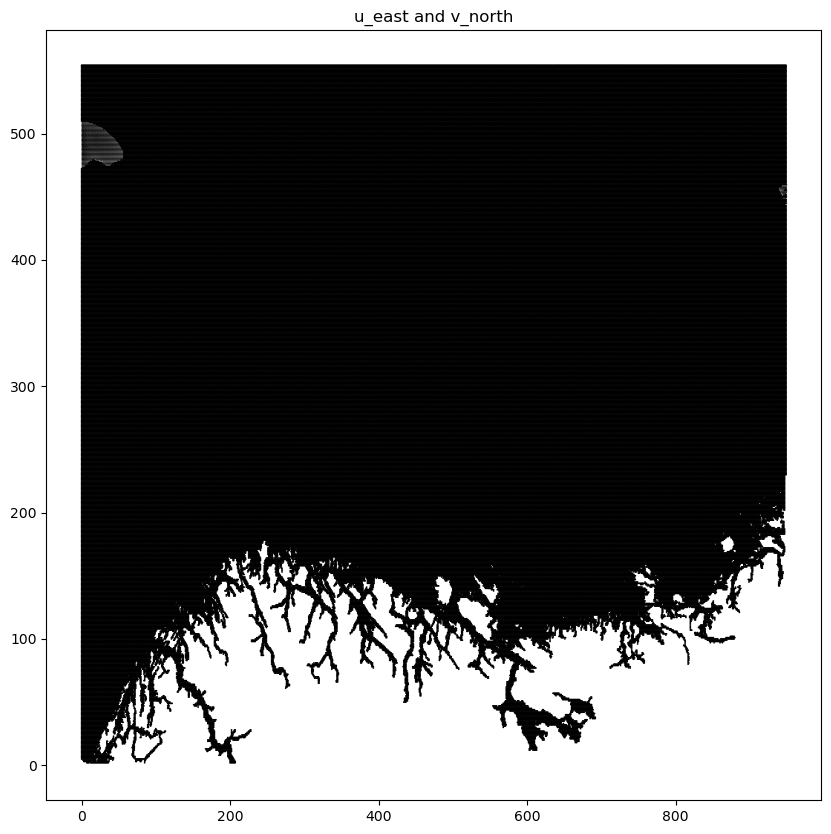

In [27]:
plt.figure(figsize=(10, 10))
plt.imshow(u[0, :, :], cmap=cm.viridis, origin='lower', interpolation='nearest')
plt.colorbar()  
plt.title("u_east")
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(v[0, :, :], cmap=cm.viridis, origin='lower', interpolation='nearest')
plt.colorbar()
plt.title("v_north")
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(np.sqrt(u[0, :, :]**2 + v[0, :, :]**2), origin='lower', interpolation='nearest')
plt.show

plt.figure(figsize=(10, 10))
plt.quiver(u[0, :, :], v[0, :, :], scale=0.5, color='black', units="xy")
plt.title("u_east and v_north")
plt.show()


In [35]:
inds_x = np.arange(400, 500, 1, dtype=int)
inds_y = np.arange(300, 400, 1, dtype=int)

u_arr = np.array(u[1, :, :])
print(u_arr.shape)
print(u_arr[inds_x, :].shape)
print(u_arr[:, inds_y].shape)
print(u_arr[inds_x, inds_y].shape)
print(u_arr[inds_x, :][:, inds_y].shape)

(555, 950)
(100, 950)
(555, 100)
(100,)
(100, 100)


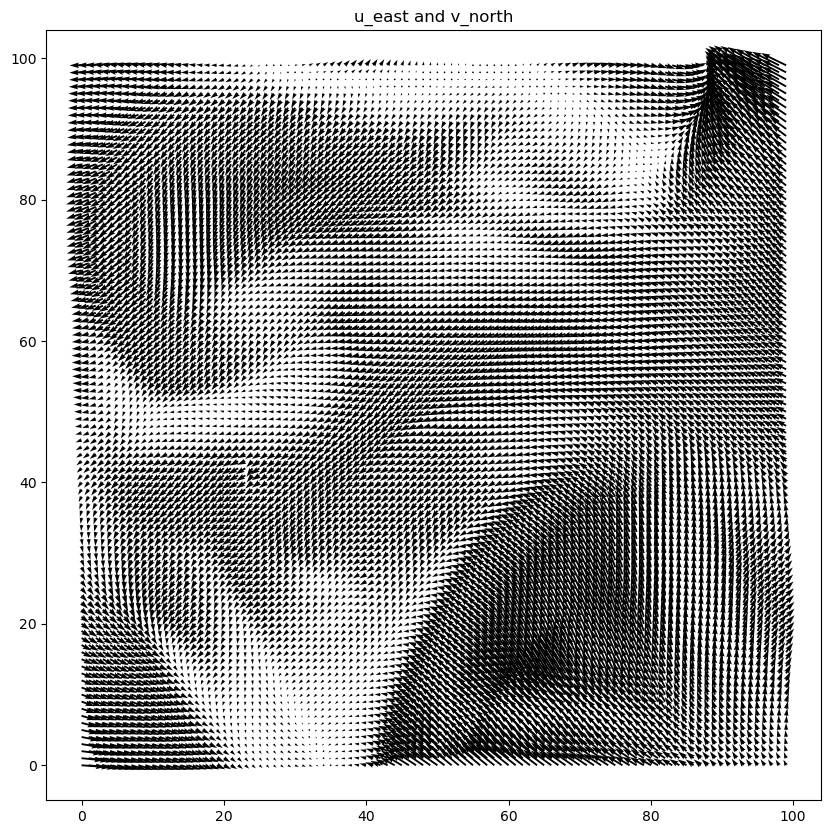

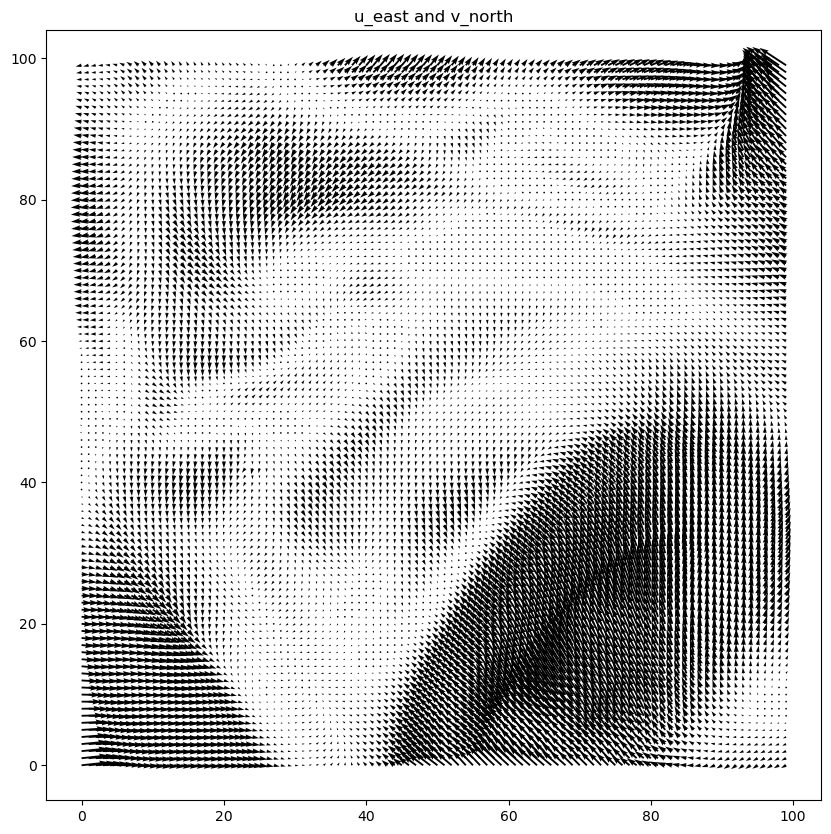

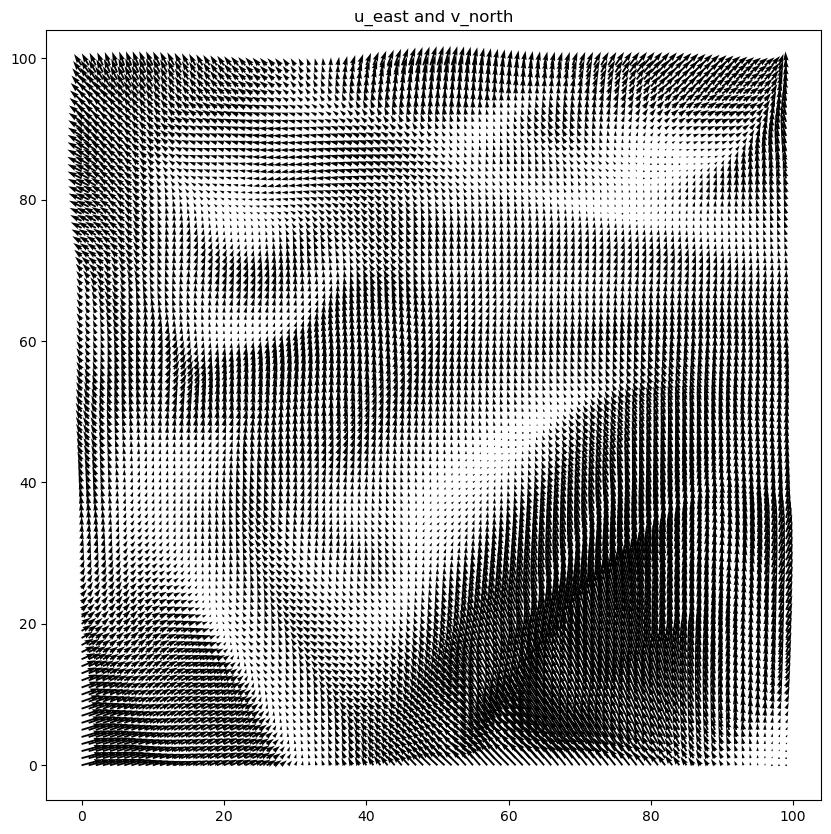

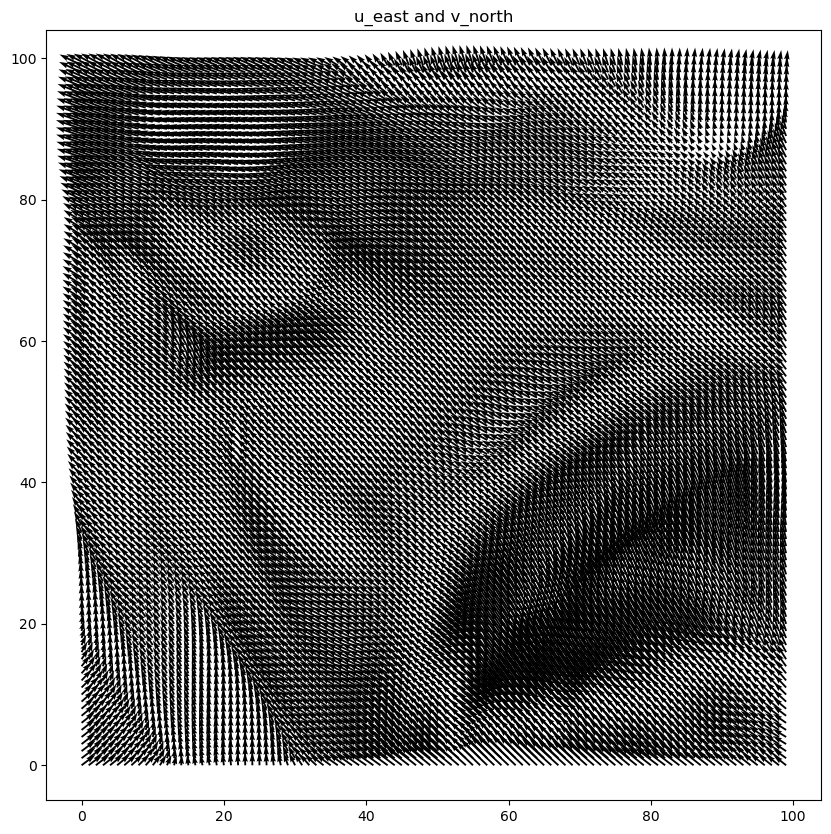

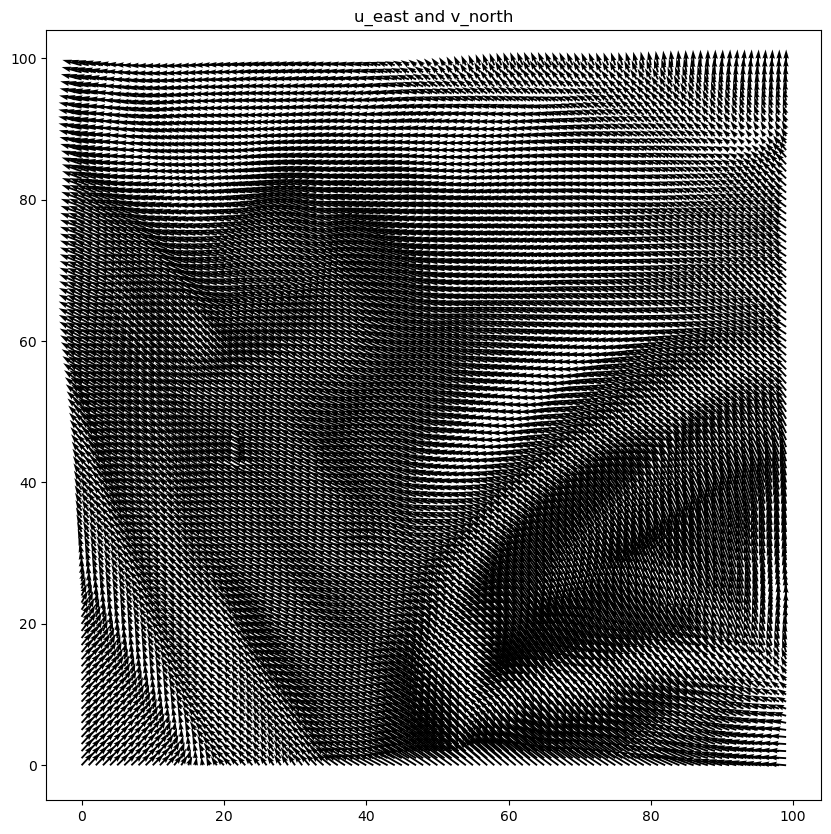

...

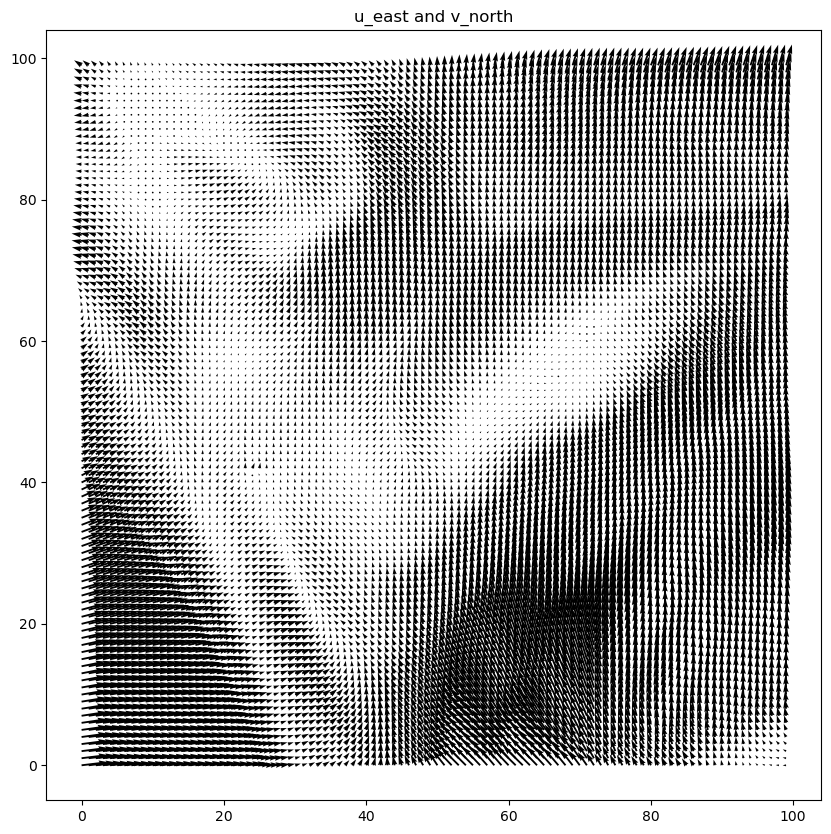

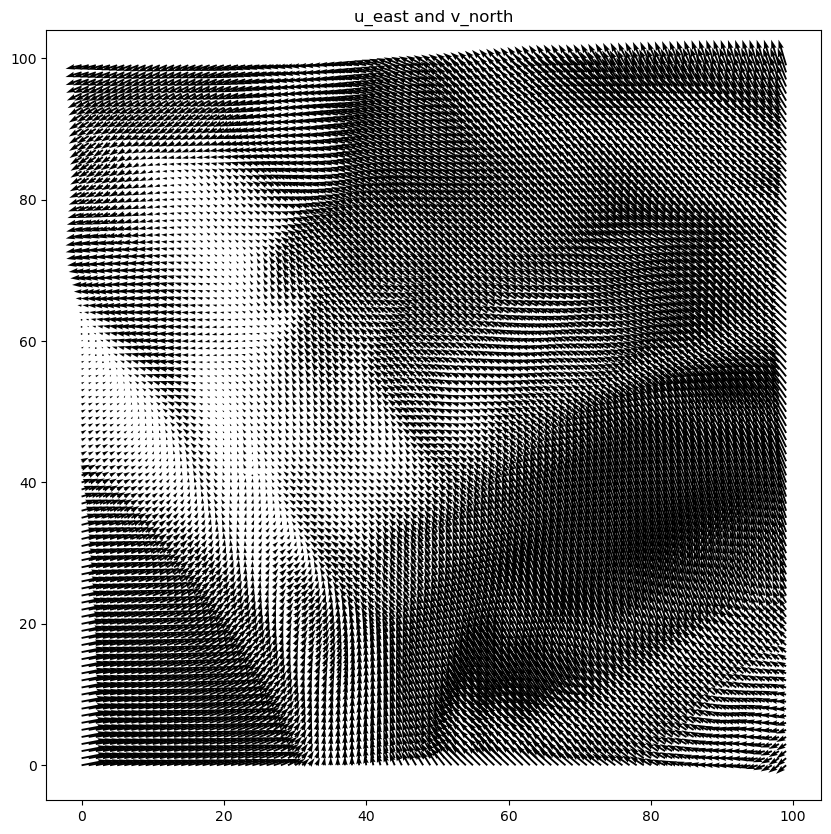

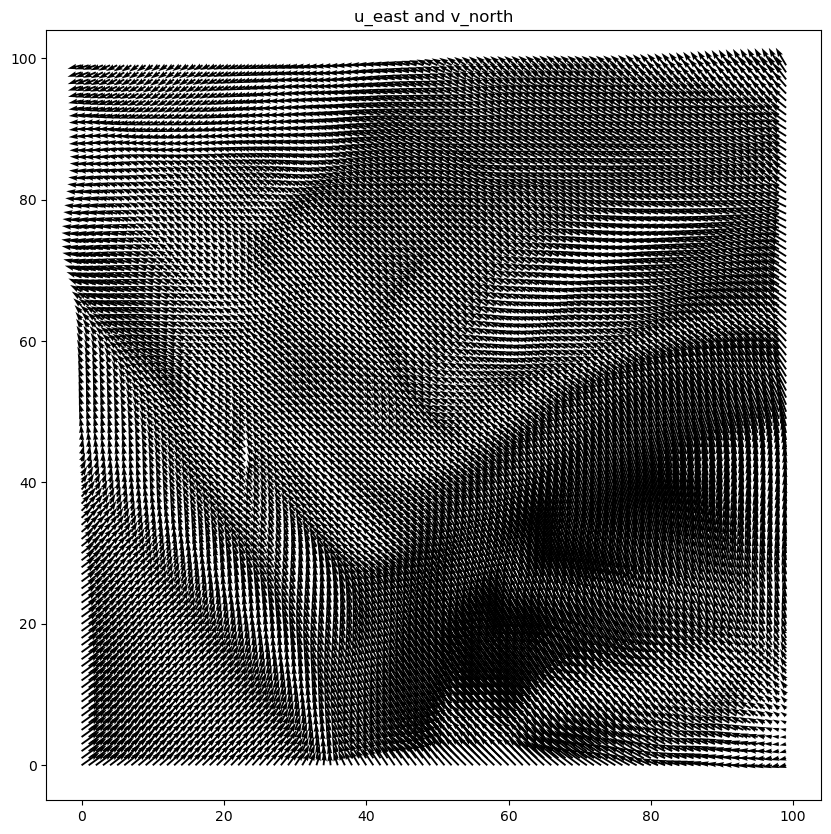

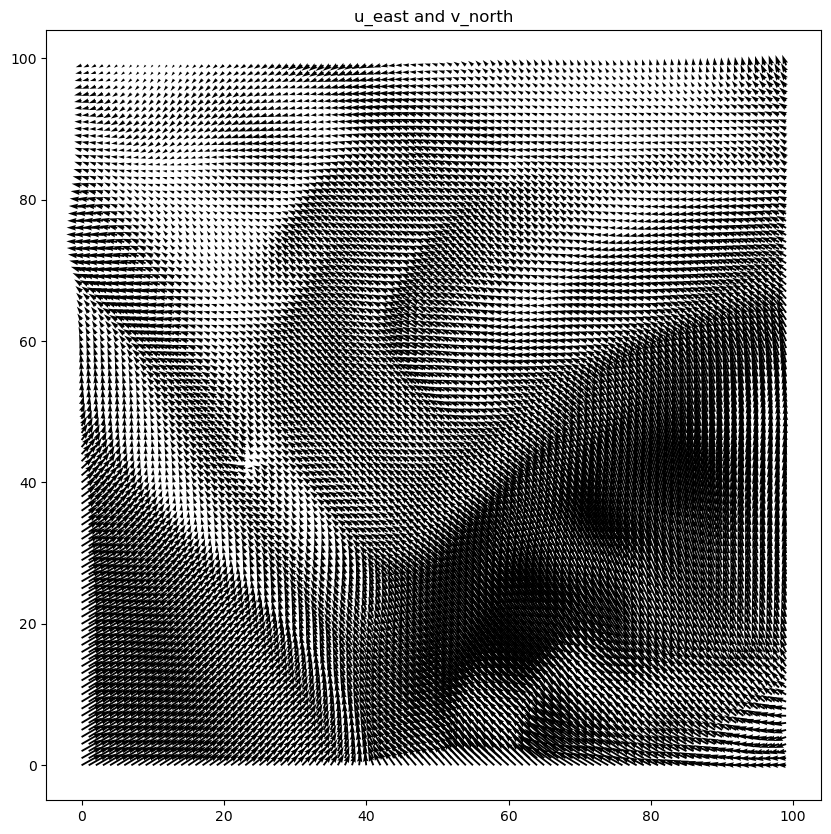

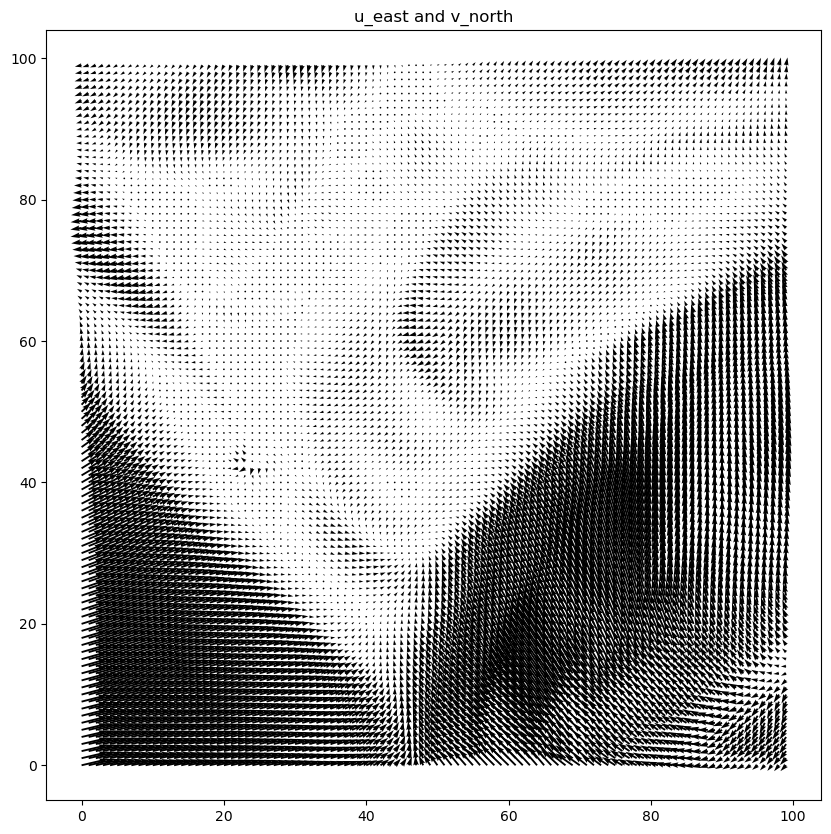

In [50]:
depth_layer = 0
for i in np.arange(0, 108, 10):
    u = sinmod_c.sinmod_file.variables["u_east"][i, depth_layer, :, :]
    v = sinmod_c.sinmod_file.variables["v_north"][i, depth_layer, :, :]
    plt.figure(figsize=(10, 10))

    u_arr = np.array(u[:, :])
    v_arr = np.array(v[:, :])
    plt.quiver(u_arr[inds_x, :][:, inds_y], v_arr[inds_x, :][:, inds_y], scale=10, color='black')
    plt.title("u_east and v_north")
    plt.show()


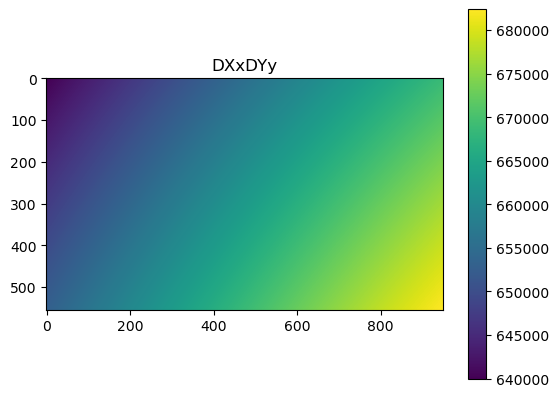

In [7]:
DXxDYy = np.array(sinmod_c.sinmod_file.variables["DXxDYy"][:])
DXxDYy.shape

plt.imshow(DXxDYy)
plt.colorbar()
plt.title("DXxDYy")
plt.show()


In [ ]:
xx, yy = sinmod_c.sinmod_data["flatten"]["xc"], sinmod_c.sinmod_data["flatten"]["yc"]
plt.plot(xx, yy, "o", markersize=1, color="black")
inds_inside_bound = sinmod_c.sinmod_data["flatten"]["inds_inside_boundary"]
plt.plot(xx[inds_inside_bound], yy[inds_inside_bound], "o", markersize=1, color="red")
land_inds = sinmod_c.sinmod_data["flatten"]["land_inds"]
plt.plot(xx[land_inds], yy[land_inds], "o", markersize=1, color="blue")
shore_inds = sinmod_c.sinmod_data["flatten"]["shore_inds"]
ocean_inds = sinmod_c.sinmod_data["flatten"]["ocean_inds"]
plt.plot(xx[shore_inds], yy[shore_inds], "o", markersize=1, color="green")
plt.show()



In [ ]:
print(land_inds.shape)
print(inds_inside_bound.shape)
print(shore_inds.shape)
print(xx.shape)

# Join the inds inside boundary, not in land and not in shore
inds_inside_bound = np.setdiff1d(inds_inside_bound, land_inds)
inds_inside_bound = np.setdiff1d(inds_inside_bound, shore_inds)
print(inds_inside_bound.shape)

# Plot the data
fig, ax = plt.subplots()
# Plot the data
ax.scatter(xx[inds_inside_bound], yy[inds_inside_bound], s=1, c="black", marker="o")

In [ ]:
callanus = sinmod_c.sinmod_file.variables["calanus_finmarchicus"]
callanus_flatten = [callanus[i, :, :].flatten() for i in range(callanus.shape[0])]
callanus_flatten = np.array(callanus_flatten)
print(callanus_flatten.shape)


for i in range(callanus_flatten.shape[0]):

    plt.scatter(xx[ocean_inds], yy[ocean_inds], c=callanus_flatten[i, ocean_inds], label=f"Time step {i}", s=1, cmap="jet")
    plt.colorbar(label="Callanus finmarchicus")
    plt.show()

In [ ]:
callanus = sinmod_c.sinmod_file.variables["calanus_finmarchicus"]
callanus_flatten = [callanus[i, :, :].flatten() for i in range(callanus.shape[0])]
callanus_flatten = np.array(callanus_flatten)
print(callanus_flatten.shape)


for i in range(callanus_flatten.shape[0]):

    plt.scatter(xx[ocean_inds], yy[ocean_inds], c=np.log(callanus_flatten[i, ocean_inds]+0.000001), label=f"Time step {i}", s=1, cmap="jet", vmin=-5)
    plt.colorbar(label="Callanus finmarchicus")
    plt.show()

In [ ]:
time = sinmod_c.sinmod_file.variables["time"][:]
print(time)
year = time[:,0]
month = time[:,1]
day = time[:,2]
hour = time[:,3]
minute = time[:,4]
second = time[:,5]



print(year)
print(month)
print(day)
print(hour)
print(minute)
print(second)

for i in range(len(year)):
    print(f"time step {i}: {year[i]}-{month[i]}-{day[i]} {hour[i]}:{minute[i]}:{second[i]}")
    datetime_time = datetime.datetime(year[i],month[i],day[i], hour[i], minute[i], second[i])
    timestamp = datetime_time.timestamp()
    print(datetime.datetime(year[i],month[i],day[i], minute[i], second[i]))
    print(datetime_time)
    print(datetime_time.timestamp())


In [ ]:
t = np.array([100, 200, 300, 400, 500])
t_sep = np.array([120, 220, 430])

for t_ in t:
    
    ind_above = np.where(t_ < t_sep)[0]
    ind_below = np.where(t_ > t_sep)[0]
    print(f"t_ = {t_}, ind_above = {ind_above}, ind_below = {ind_below}")


In [ ]:
# Testing interpolation
xx = sinmod_c.sinmod_data["flatten"]["xc"]
yy = sinmod_c.sinmod_data["flatten"]["yc"]
valid_inds = sinmod_c.sinmod_data["flatten"]["valid_points"]
calanus = sinmod_c.sinmod_data["flatten"]["calanus_finmarchicus"]

points = np.array([xx[valid_inds], yy[valid_inds]]).T
calanus_finmarchicus_i = calanus[i, valid_inds].T

interpolator = interpolate.CloughTocher2DInterpolator(points, calanus_finmarchicus_i, tol = 0.1, fill_value=0)

In [ ]:
sinmod_c.sinmod_file.variables 

In [ ]:
sinmod_c.sinmod_data["timestamp_seconds"]

In [ ]:
xx_interp = np.linspace(np.min(xx[valid_inds]), np.max(xx[valid_inds]), 200)
yy_interp = np.linspace(np.min(yy[valid_inds]), np.max(yy[valid_inds]), 200)
xx_interp, yy_interp = np.meshgrid(xx_interp, yy_interp)
points_interp = np.array([xx_interp.flatten(), yy_interp.flatten()]).T
T = np.array([datetime_time.timestamp() for i in range(len(xx_interp.flatten()))])



for i, t in enumerate(sinmod_c.sinmod_data["timestamp_seconds"]):

    T = np.repeat(t, len(xx_interp.flatten()))

    calanus_interp = sinmod_c.get_prior_S_T(points_interp, T)
    calanus_finmarchicus_i = calanus[i, valid_inds].T
    fig, ax = plt.subplots(1,2, figsize=(12, 6))
    vmin, vmax = np.log(np.min(calanus_finmarchicus_i + 0.001)), np.log(np.max(calanus_finmarchicus_i))
    # Plot the data
    ax[1].scatter(xx[valid_inds], yy[valid_inds], s=1, c=np.log(calanus_finmarchicus_i+0.001), label=f"Time step {i}", cmap="jet",
                    vmin=vmin, vmax=vmax)
        
    ax[0].scatter(xx_interp, yy_interp, s=1, c=np.log(calanus_interp+0.001), label=f"Time step {i}", cmap="jet", 
                    vmin=vmin, vmax=vmax)

    ax[0].scatter(xx[land_inds], yy[land_inds], s=5, c="black")
    ax[1].scatter(xx[land_inds], yy[land_inds], s=10, c="black")
    ax[0].set_title("Interpolated")
    ax[1].set_title("Original")
    ax[0].set_xlabel("x")
    ax[0].set_ylabel("y")
    ax[1].set_xlabel("x")
    ax[1].set_ylabel("y")
    ax[0].set_xlim(np.min(xx[valid_inds]), np.max(xx[valid_inds]))
    ax[0].set_ylim(np.min(yy[valid_inds]), np.max(yy[valid_inds]))
    ax[1].set_xlim(np.min(xx[valid_inds]), np.max(xx[valid_inds]))
    ax[1].set_ylim(np.min(yy[valid_inds]), np.max(yy[valid_inds]))
    plt.show()


In [ ]:
# Test the interpolation


# Make this to a video 
import matplotlib.animation as animation
from matplotlib import rc
from matplotlib import rcParams




xx_interp = np.linspace(np.min(xx[valid_inds]), np.max(xx[valid_inds]), 200)
yy_interp = np.linspace(np.min(yy[valid_inds]), np.max(yy[valid_inds]), 200)
xx_interp, yy_interp = np.meshgrid(xx_interp, yy_interp)
points_interp = np.array([xx_interp.flatten(), yy_interp.flatten()]).T
time_steps = sinmod_c.sinmod_data["timestamp_seconds"]
dt = time_steps[1] - time_steps[0]
time_steps = np.linspace(time_steps[0] - dt*0.2, time_steps[-1]+dt*0.2, 100)
#time_steps = np.linspace(time.time(), time.time() + 10*dt, 20)


def animate_func(i):
    T = np.repeat(time_steps[i], len(xx_interp.flatten()))

    calanus_interp = sinmod_c.get_prior_S_T(points_interp, T)
    vmin, vmax = np.log(np.min(calanus_finmarchicus_i + 0.001)), np.log(np.max(calanus_finmarchicus_i))
    # Reshape to make it a 2D array for imshow
    calanus_interp = calanus_interp.reshape(xx_interp.shape)


    # Plot the data  
    ax.imshow(np.log(calanus_interp+0.001), extent=(np.min(xx[valid_inds]), np.max(xx[valid_inds]), np.min(yy[valid_inds]), np.max(yy[valid_inds])), 
                origin="lower", aspect="auto", cmap="jet", vmin=vmin, vmax=vmax)
    #ax.scatter(xx_interp, yy_interp, s=1, c=np.log(calanus_interp+0.001), label=f"Time step {i}", cmap="jet", 
    #                vmin=vmin, vmax=vmax)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    timestep = datetime.datetime.fromtimestamp(t)
    ax.set_title(f"Interpolated at {timestep}")
    ax.set_xlim(np.min(xx[valid_inds]), np.max(xx[valid_inds]))
    ax.set_ylim(np.min(yy[valid_inds]), np.max(yy[valid_inds]))

    #plt.colorbar(label="log(Calanus finmarchicus)")
    
    return ax


fig, ax = plt.subplots(1,1, figsize=(12, 6))
vmin, vmax = np.log(np.min(calanus_finmarchicus_i + 0.001)), np.log(np.max(calanus_finmarchicus_i))
# Reshape to make it a 2D array for imshow
calanus_interp = calanus_interp.reshape(xx_interp.shape)
# Plot the data
ax.imshow(np.log(calanus_interp+0.001), extent=(np.min(xx[valid_inds]), np.max(xx[valid_inds]), np.min(yy[valid_inds]), np.max(yy[valid_inds])),
            origin="lower", aspect="auto", cmap="jet", vmin=vmin, vmax=vmax)
#ax.scatter(xx_interp, yy_interp, s=1, c=np.log(calanus_interp+0.001), label=f"Time step {i}", cmap="jet",
#                vmin=vmin, vmax=vmax)
ax.set_xlabel("x")
ax.set_ylabel("y")
timestep = datetime.datetime.fromtimestamp(t)
ax.set_title(f"Interpolated at {timestep}")
ax.set_xlim(np.min(xx[valid_inds]), np.max(xx[valid_inds]))
ax.set_ylim(np.min(yy[valid_inds]), np.max(yy[valid_inds]))
#plt.colorbar(label="log(Calanus finmarchicus)")
# Create the animation
ani = animation.FuncAnimation(fig, animate_func, frames=len(time_steps), interval=1000, blit=False)

# Save the animation
#ani.save(plot_test_path + "Sinmod_interpolation_test.mp4", writer='ffmpeg', fps=10, dpi=300)
# Test the interpolation
# Make this to a video

ani.save(filename="ffmpeg_example.gif", writer="ffmpeg")


         

In [ ]:
np.min(calanus_finmarchicus_i)

In [ ]:
# Plot histogram of calanus
calanus = calanus.flatten()
calanus = calanus.flatten()[valid_inds]

plt.hist(calanus, bins=100)
plt.yscale("log")
plt.xlabel("Calanus finmarchicus")
plt.ylabel("Frequency")
plt.title("Histogram of Calanus finmarchicus")
plt.show()


lowest_val = np.exp(-6)
filtered_calanus = calanus_finmarchicus_i[calanus_finmarchicus_i > lowest_val]

print(len(calanus_finmarchicus_i))
print(len(filtered_calanus))


log_filtered_calanus = np.log(filtered_calanus)
mean_calanus = np.mean(log_filtered_calanus)
std_calanus = np.std(log_filtered_calanus)
print("Mean calanus finmarchicus: ", mean_calanus)

plt.hist(np.log(filtered_calanus), bins=100, density=True, alpha=0.6, color='blue')
x_line = np.linspace(np.min(np.log(filtered_calanus)), np.max(np.log(filtered_calanus)), 100)
y_line = norm.pdf(x_line, mean_calanus, std_calanus)
plt.plot(x_line, y_line, color="red", label="Normal distribution")
plt.xlabel("Log(Calanus finmarchicus)")
plt.ylabel("Frequency")
plt.title("Histogram of Log(Calanus finmarchicus)")
plt.xlim(np.min(np.log(filtered_calanus)), np.max(np.log(filtered_calanus)))
plt.show()

In [ ]:
for i in range(3):

    calanus_finmarchicus_i = callanus_flatten[i, valid_inds].T
    lowest_val = np.exp(-4)
    filtered_calanus = calanus_finmarchicus_i[calanus_finmarchicus_i > lowest_val]

    print(len(calanus_finmarchicus_i))
    print(len(filtered_calanus))


    log_filtered_calanus = np.log(filtered_calanus)
    mean_calanus = np.mean(log_filtered_calanus)
    std_calanus = np.std(log_filtered_calanus)
    print("Mean calanus finmarchicus: ", mean_calanus)

    plt.hist(np.log(filtered_calanus), bins=100, density=True, alpha=0.6, color='blue')
    x_line = np.linspace(np.min(np.log(filtered_calanus)), np.max(np.log(filtered_calanus)), 100)
    y_line = norm.pdf(x_line, mean_calanus, std_calanus)
    plt.plot(x_line, y_line, color="red", label="Normal distribution")
    plt.xlabel("Log(Calanus finmarchicus)")
    plt.ylabel("Frequency")
    plt.title("Histogram of Log(Calanus finmarchicus)")
    plt.xlim(np.min(np.log(filtered_calanus)), np.max(np.log(filtered_calanus)))
    plt.show()

In [ ]:
#### Testing goodness of fit for the distribution of calanus finmarchicus 
from scipy import stats
from scipy.stats import kstest
from scipy.stats import chisquare
from scipy.stats import norm
from scipy.stats import lognorm
from scipy.stats import gamma
from scipy.stats import weibull_min
from scipy.stats import beta
from scipy.stats import uniform
from scipy.stats import expon
from scipy.stats import pearsonr
from scipy.stats import chisquare
from scipy.stats import anderson
from scipy.stats import ks_2samp
from scipy.stats import shapiro


models = {
    "Normal": {"cdf": norm.cdf, "pdf": norm.pdf, "params": norm.fit},
    "Lognormal": {"cdf": lognorm.cdf, "pdf": lognorm.pdf, "params": lognorm.fit},
    "Gamma": {"cdf": gamma.cdf, "pdf": gamma.pdf, "params": gamma.fit},
    "Weibull": {"cdf": weibull_min.cdf, "pdf": weibull_min.pdf, "params": weibull_min.fit},
    "Beta": {"cdf": beta.cdf, "pdf": beta.pdf, "params": beta.fit},
    "Uniform": {"cdf": uniform.cdf, "pdf": uniform.pdf, "params": uniform.fit},
    "Exponential": {"cdf": expon.cdf, "pdf": expon.pdf, "params": expon.fit}
}

def r2_score(y_true, y_pred):
    """Calculate R-squared score"""
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    return 1 - (ss_res / ss_tot)

def predict_distribution(model, data):
    """Predict distribution parameters"""
    params = model["params"](data)
    return model["pdf"](data, *params)

data = filtered_calanus
for model_name, model in models.items():
    # Fit the model to the data
    params = model["params"](data)
    print(f"Fitted parameters for {model_name}: {params}")

    # Calculate the CDF and PDF of the fitted model
    cdf = model["cdf"](data, *params)
    pdf = model["pdf"](data, *params)

    # Calculate the KS statistic
    ks_statistic, ks_p_value = kstest(data, model["cdf"], args=params)
    print(f"KS statistic for {model_name}: {ks_statistic}, p-value: {ks_p_value}")

    # Perform Anderson-Darling test
    #ad_result = anderson(data, dist=model_name)
    #print(f"Anderson-Darling test for {model_name}: statistic: {ad_result.statistic}, critical values: {ad_result.critical_values}, significance level: {ad_result.significance_level}")

    # Perform Shapiro-Wilk test
    shapiro_statistic, shapiro_p_value = shapiro(data)
    print(f"Shapiro-Wilk test for {model_name}: statistic: {shapiro_statistic}, p-value: {shapiro_p_value}")


    # Perform R2 score
    r2 = r2_score(data, predict_distribution(model, data))
    print(f"R2 score for {model_name}: {r2}")


In [ ]:
# Variogram analysis
from scipy.spatial import distance_matrix
from scipy.spatial.distance import pdist, squareform
import skgstat as skg


random_inds = np.random.choice(valid_inds, size=1000, replace=False)
S = np.array([xx[random_inds], yy[random_inds]]).T
i = 1
calanus_finmarchicus = calanus[i, random_inds].T

# Calculate the distance matrix
D = distance_matrix(S, S)

# Get the pairwise differences
Z = np.abs(calanus_finmarchicus[:, None] - calanus_finmarchicus[None, :])
print(Z.shape)

plt.plot(D.flatten(), Z.flatten(), "o", markersize=1, color="black", alpha=0.05)
plt.xlabel("Distance")
plt.ylabel("Difference")
plt.show()

Z_log = np.abs(np.log(calanus_finmarchicus[:, None] + 0.0001) - np.log(calanus_finmarchicus[None, :] + 0.0001))
plt.plot(D.flatten(), Z_log.flatten(), "o", markersize=1, color="black", alpha=0.05)
plt.xlabel("Distance")
plt.ylabel("Difference")
plt.show()

In [ ]:
xc = sinmod_c.sinmod_data["xc"]
print([xc[1:] - xc[:-1]][0])


In [ ]:
DxDy = sinmod_c.sinmod_file.variables["DXxDYy"]

In [ ]:
plt.plot(DxDy[:].flatten(), "o", markersize=1, color="black", alpha=0.05)

In [46]:
# Check time to inverse matrix
from time  import time
# Make random matrix
n = 34708
for i in np.linspace(1, n, 10, dtype=int):
    start = time()
    A = np.random.rand(i, i)
    inter_time = time()
    B = np.random.rand(i, i)
    A_inv = np.linalg.inv(A)
    print(f"Time to generate matrix {i,i}: ", inter_time - start)
    end = time()
    print("Time to inverse matrix: ", end - inter_time)

    t2 = time()
    A @ B
    print("Time to multiply matrix: ", time() - t2)

    if time() - start > 60:
        print("Too long time to inverse matrix")
        break

# Test the inverse matrix


Time to generate matrix (1, 1):  0.028525114059448242
Time to inverse matrix:  0.046862125396728516
Time to multiply matrix:  -0.002117156982421875
Time to generate matrix (3857, 3857):  0.25622105598449707
Time to inverse matrix:  5.04640793800354
Time to multiply matrix:  -11.011234045028687
Time to generate matrix (7713, 7713):  1.2927308082580566
Time to inverse matrix:  28.93958306312561
Time to multiply matrix:  -21.201877117156982
Time to generate matrix (11570, 11570):  2.4181768894195557
Time to inverse matrix:  94.05310320854187
Time to multiply matrix:  -64.65823125839233
Too long time to inverse matrix


In [ ]:
print(np.min(calanus_interp))

In [ ]:
a = np.array([-3,-2,-1,0,1, 2, 3])
a = np.clip(a, 0, None)
print(a)

In [ ]:
T.shape

In [51]:

T = np.array([datetime_time.timestamp() for i in range(len(xx_interp.flatten()))])
calanus_interp = sinmod_c.get_prior_S_T(points_interp, T)
calanus_interp = np.clip(calanus_interp, 0, None)
vmin, vmax = np.log(np.min(calanus_interp + 0.001)), np.log(np.max(calanus_interp))
# Reshape to make it a 2D array for imshow
calanus_interp = calanus_interp.reshape(xx_interp.shape)

distance_window = 4000
size = int(distance_window / 160)

calanus_interp = np.clip(calanus_interp, 0, None)
log_callanus_interp = np.log(calanus_interp + 0.001)

filtered_log_callanus_interp = uniform_filter(log_callanus_interp, size=size, mode='constant')

fig, ax = plt.subplots(1,2, figsize=(12, 6))
# Plot the data
ax[0].imshow(log_callanus_interp, extent=(np.min(xx[valid_inds]), np.max(xx[valid_inds]), np.min(yy[valid_inds]), np.max(yy[valid_inds])), 
                origin="lower", aspect="auto", cmap="jet", vmin=vmin, vmax=vmax)
ax[1].imshow(filtered_log_callanus_interp, extent=(np.min(xx[valid_inds]), np.max(xx[valid_inds]), np.min(yy[valid_inds]), np.max(yy[valid_inds])),
                origin="lower", aspect="auto", cmap="jet", vmin=vmin, vmax=vmax)
ax[0].set_title("Interpolated")
ax[1].set_title("Filtered")
for axx in ax:
    axx.scatter(xx[land_inds], yy[land_inds], s=5, c="black")
    axx.scatter(xx[shore_inds], yy[shore_inds], s=5, c="black")
    axx.set_xlabel("x")
    axx.set_ylabel("y")
    axx.set_xlim(np.min(xx[valid_inds]), np.max(xx[valid_inds]))
    axx.set_ylim(np.min(yy[valid_inds]), np.max(yy[valid_inds]))


plt.show()

NameError: name 'xx_interp' is not defined